# Load the data

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file
df = pd.read_csv("data/cleaned/Big Data 5 cleaned.csv", encoding="utf-8")

# Display the first few rows to verify the data
print("First few rows of the dataset:")
print("\nRenaming columns:")
df = df.rename(
    columns={
        "stock__share_type__company__industry__industry_group__sector__name": "sector",
        "stock__share_type__company__country__region": "region",
        "stock__share_type__company__name": "company",
    }
)
df.head()

print("\nShape of the dataset:")
print(df.shape)
print(df.columns)

First few rows of the dataset:

Renaming columns:

Shape of the dataset:
(91499, 17)
Index(['stock__ticker', 'company', 'sector', 'region', 'date', 'quality',
       'growth', 'value', 'dividend', 'market_cap_usd', 'volume', 'profit_1m',
       'profit_3m', 'profit_6m', 'profit_1y', 'profit_2y', 'profit_5y'],
      dtype='object')


# Correlations

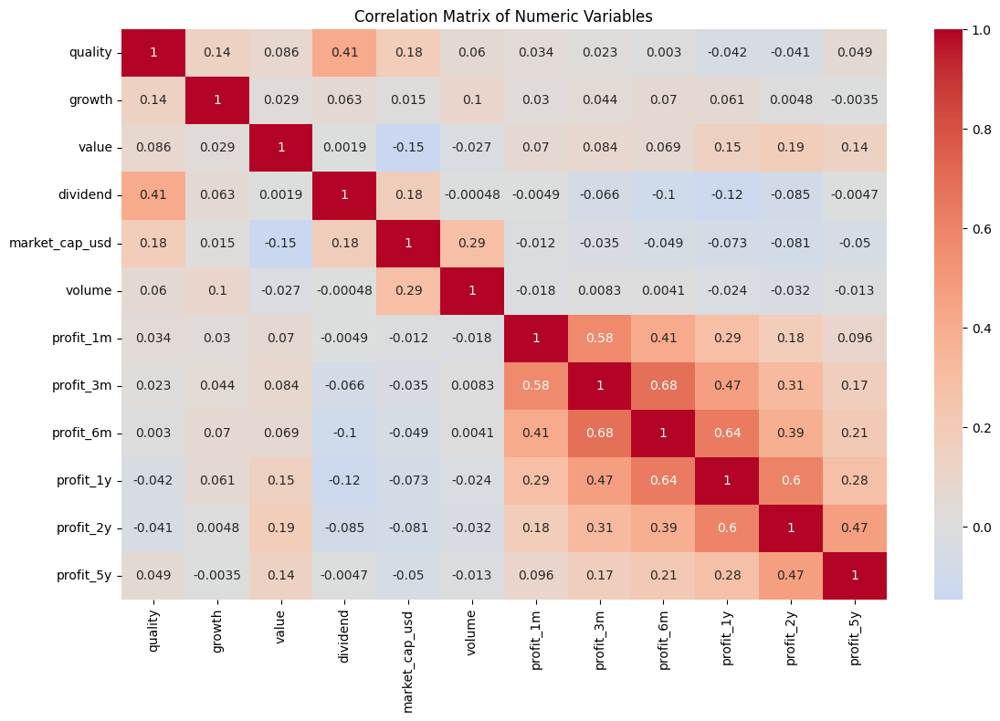

In [2]:
# Select only numeric columns
scores = [
    "quality",
    "growth",
    "value",
    "dividend",
    "market_cap_usd",
    "volume",
    "profit_1m",
    "profit_3m",
    "profit_6m",
    "profit_1y",
    "profit_2y",
    "profit_5y",
]

# Create correlation matrix using numeric columns only
df_numeric = df[scores]
correlation_matrix = df_numeric.corr()

# Plot using seaborn for better visualization
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", center=0)
plt.title("Correlation Matrix of Numeric Variables")
plt.tight_layout()
plt.show()

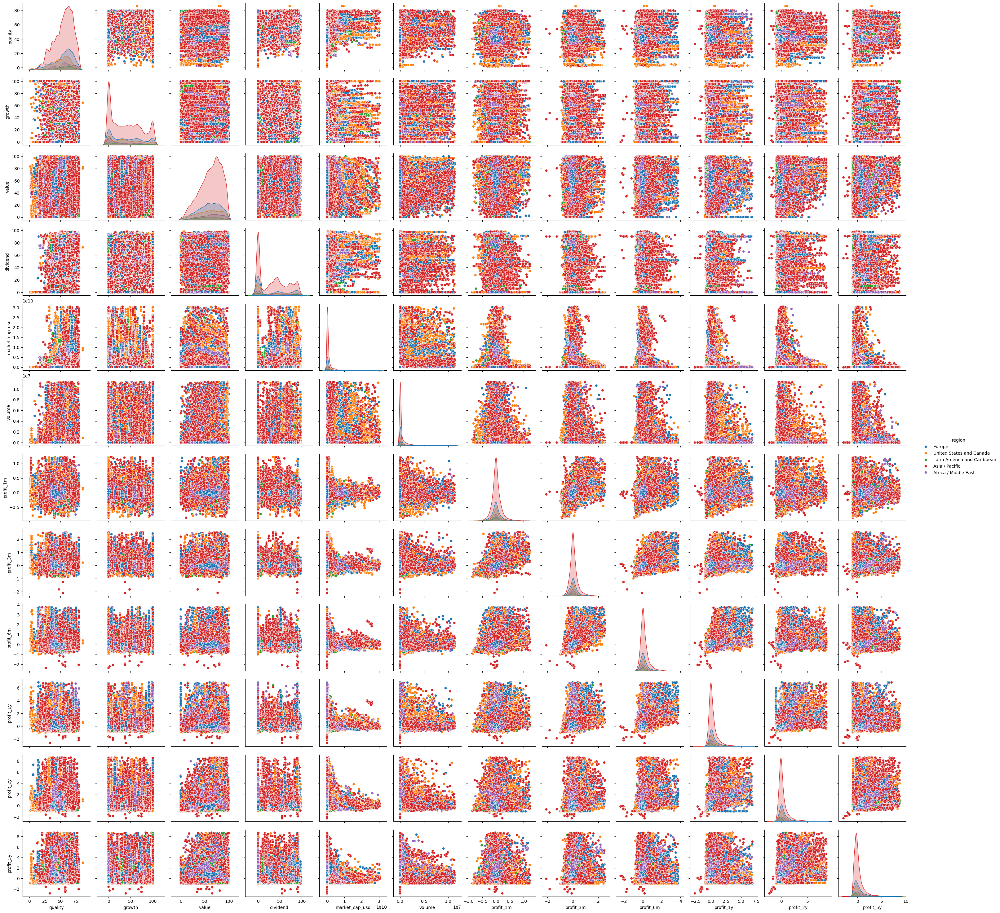

In [3]:
# Create pairplot using a sample of the data to avoid memory issues
# sample_size = 100000  # Adjust this number based on your system's capabilities
# df_sample = df.sample(
#     n=sample_size, random_state=42
# )  # Using random_state=42 for reproducibility

# Create pairplot using the sampled dataframe
sns.pairplot(
    df,
    hue="region",
)
plt.show()

# PCA

Original data shape: (91499, 4)
Cleaned data shape (after removing NaNs): (91499, 4)
Number of rows removed: 0
Percentage of data retained: 100.0%


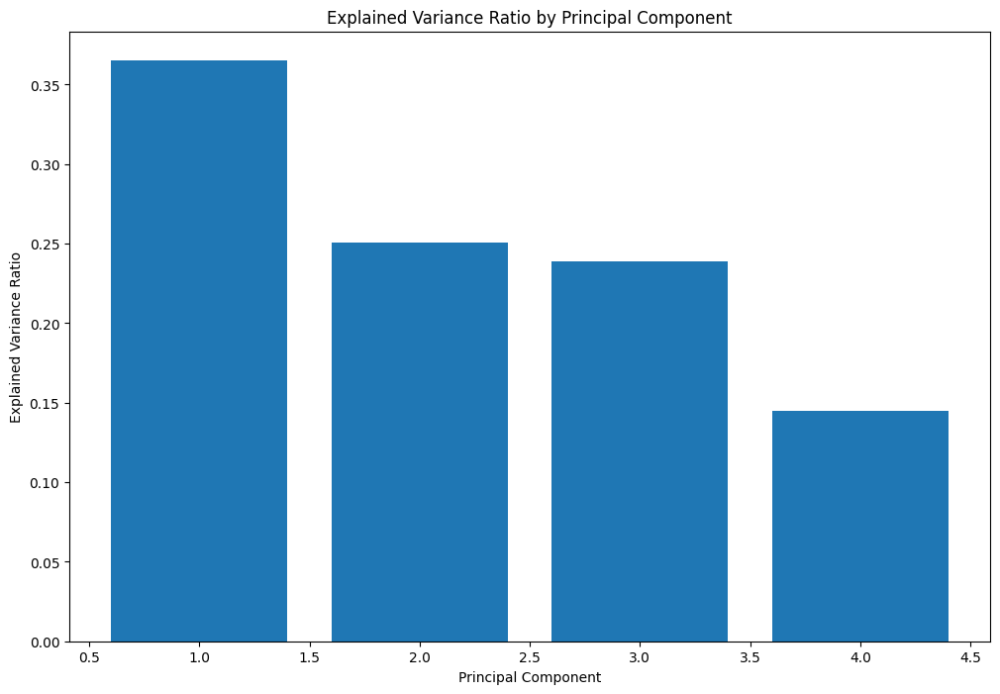

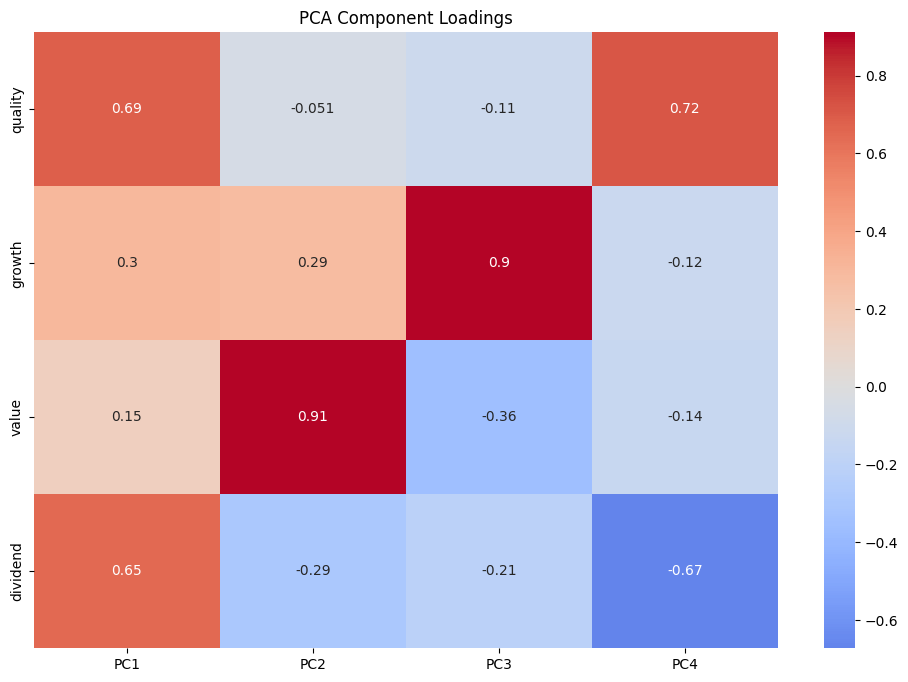

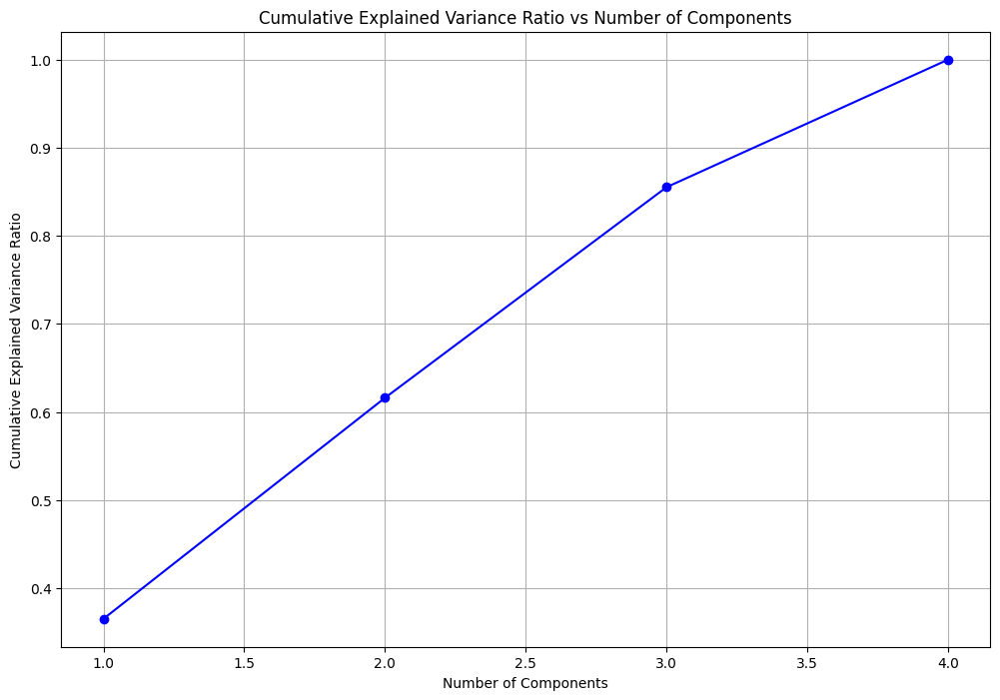

In [4]:
import scipy
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import numpy as np

# Prepare data for PCA
features = [
    "quality",
    "growth",
    "value",
    "dividend",
]
X = df[features]

# Standardize the features


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA

pca = PCA()
# Drop rows with NaN values before PCA
X_scaled_clean = X_scaled[~np.isnan(X_scaled).any(axis=1)]
# Compare size of cleaned vs original data
print(f"Original data shape: {X_scaled.shape}")
print(f"Cleaned data shape (after removing NaNs): {X_scaled_clean.shape}")
print(f"Number of rows removed: {X_scaled.shape[0] - X_scaled_clean.shape[0]}")
print(
    f"Percentage of data retained: {(X_scaled_clean.shape[0]/X_scaled.shape[0]*100):.1f}%"
)


X_pca = pca.fit_transform(X_scaled_clean)

# Calculate explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Plot explained variance ratio
plt.figure(figsize=(12, 8))
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Explained Variance Ratio by Principal Component")
plt.show()

# Create a DataFrame with component loadings
loadings = pd.DataFrame(
    pca.components_.T, columns=["PC1", "PC2", "PC3", "PC4"], index=features
)

# Plot heatmap of component loadings
plt.figure(figsize=(12, 8))
sns.heatmap(loadings, annot=True, cmap="coolwarm", center=0)
plt.title("PCA Component Loadings")
plt.show()

# Calculate cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
plt.figure(figsize=(12, 8))
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, "bo-")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance Ratio")
plt.title("Cumulative Explained Variance Ratio vs Number of Components")
plt.grid(True)
plt.show()

# Checking on outliers

9.488532074437003 13.278102806687581


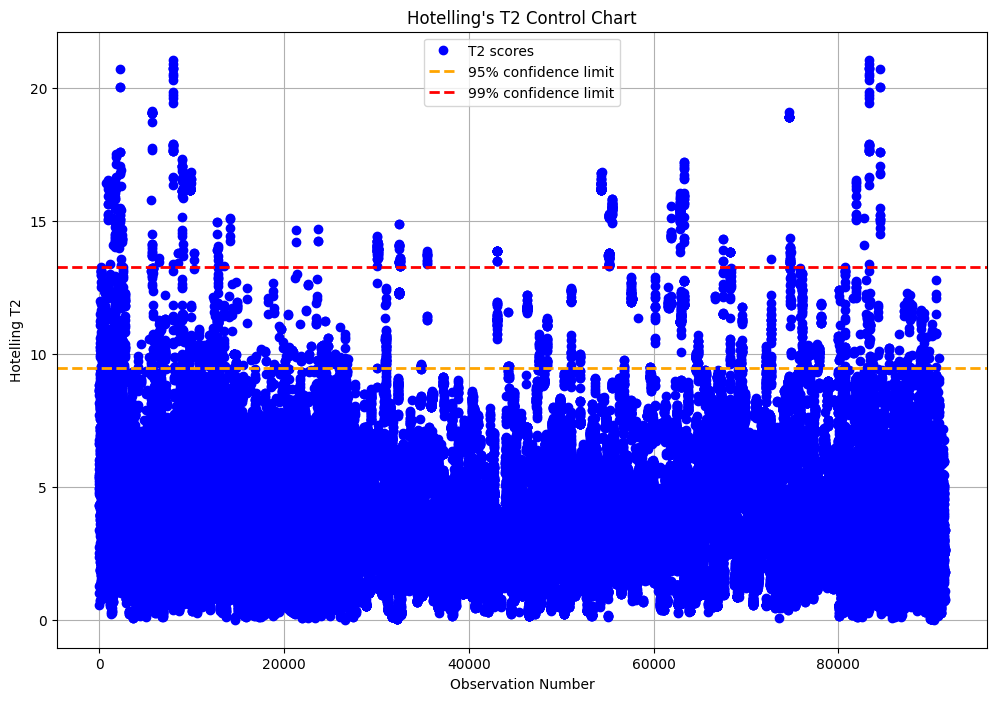

In [5]:
# Calculate Hotelling's T2 statistic
K = 4  # Number of principal components to use
scores = X_pca[:, :K]
t2_scores = np.sum(scores**2 / pca.explained_variance_[:K], axis=1)

# Calculate F-distribution critical values
n = len(X)  # Number of observations
F95 = (
    K * (n**2 - 1) / (n * (n - K)) * scipy.stats.f.ppf(0.95, K, n - K)
)  # ppf is the percent point function (inverse of cdf) of the F distribution
F99 = K * (n**2 - 1) / (n * (n - K)) * scipy.stats.f.ppf(0.99, K, n - K)
print(F95, F99)
# Plot Hotelling's T2
plt.figure(figsize=(12, 8))
plt.plot(range(1, len(t2_scores) + 1), t2_scores, "bo", label="T2 scores")
plt.axhline(
    y=F95, color="orange", linestyle="--", linewidth=2, label="95% confidence limit"
)
plt.axhline(
    y=F99, color="red", linestyle="--", linewidth=2, label="99% confidence limit"
)
plt.xlabel("Observation Number")
plt.ylabel("Hotelling T2")
plt.title("Hotelling's T2 Control Chart")
plt.legend()
plt.grid(True)
plt.show()

In [6]:
# Delete the outliers
print(df.shape, t2_scores.shape)


df = df[t2_scores < F95]
X = df[features]
X_scaled = scaler.fit_transform(X)
X_pca = pca.fit_transform(X_scaled)

(91499, 17) (91499,)


Correlations with profit_1m:
 PC1    0.035861
PC2    0.076265
PC3   -0.009941
PC4    0.022365
Name: profit_1m, dtype: float64


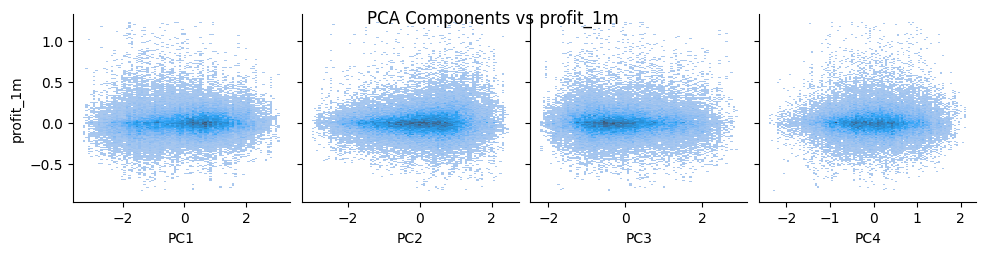

Correlations with profit_3m:
 PC1          0.005747
PC2          0.115005
PC3          0.011618
PC4          0.063706
profit_1m    0.578626
Name: profit_3m, dtype: float64


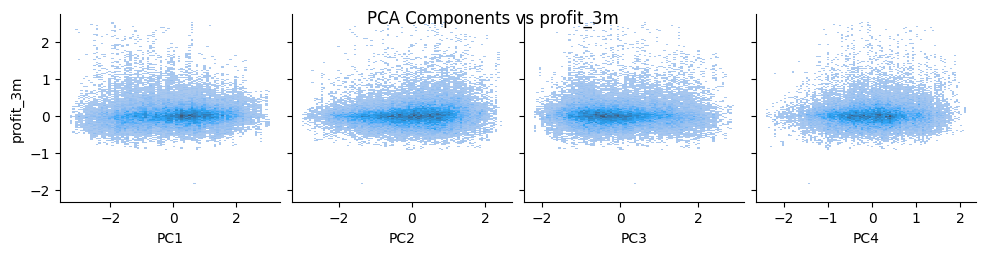

Correlations with profit_6m:
 PC1         -0.020437
PC2          0.118099
PC3          0.049581
PC4          0.067453
profit_1m    0.409640
profit_3m    0.688408
Name: profit_6m, dtype: float64


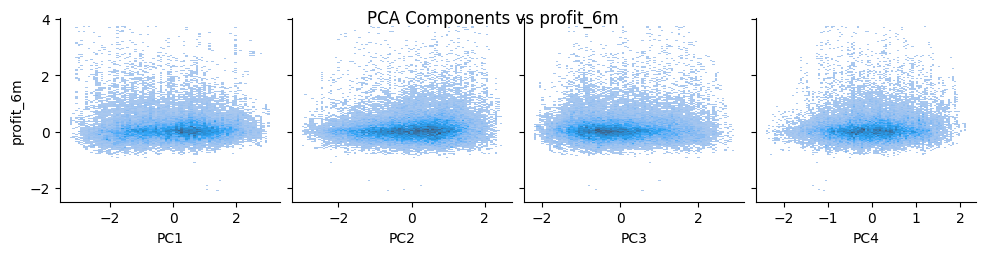

Correlations with profit_1y:
 PC1         -0.052264
PC2          0.197337
PC3          0.018448
PC4          0.032272
profit_1m    0.286433
profit_3m    0.472947
profit_6m    0.634478
Name: profit_1y, dtype: float64


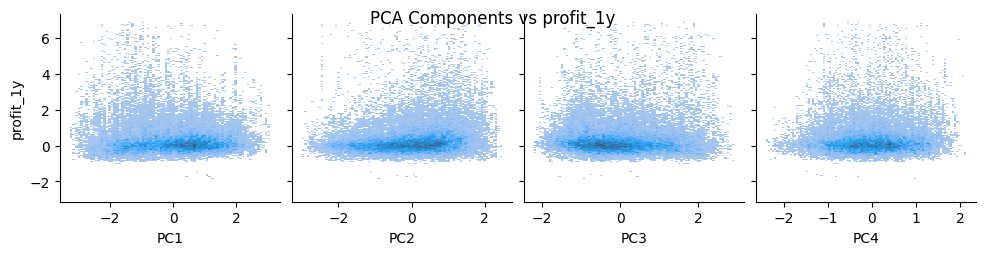

Correlations with profit_2y:
 PC1         -0.051814
PC2          0.201616
PC3         -0.043495
PC4          0.011195
profit_1m    0.184207
profit_3m    0.320015
profit_6m    0.400530
profit_1y    0.614546
Name: profit_2y, dtype: float64


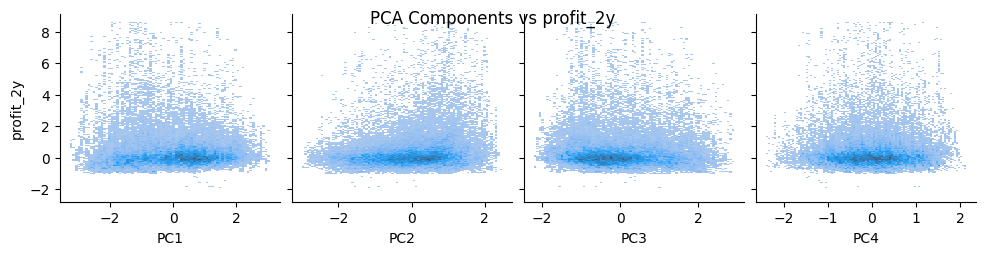

Correlations with profit_5y:
 PC1          0.026308
PC2          0.119040
PC3         -0.053816
PC4          0.018253
profit_1m    0.098726
profit_3m    0.178418
profit_6m    0.224024
profit_1y    0.284357
profit_2y    0.476574
Name: profit_5y, dtype: float64


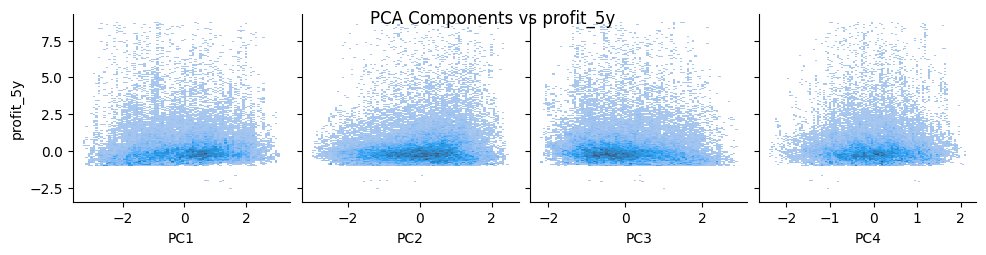

In [7]:
df_pca = pd.DataFrame(X_pca, columns=["PC1", "PC2", "PC3", "PC4"])

for target_profit in [
    "profit_1m",
    "profit_3m",
    "profit_6m",
    "profit_1y",
    "profit_2y",
    "profit_5y",
]:
    df_pca[target_profit] = df[target_profit].values  # repeat per target

    sns.pairplot(
        df_pca,
        x_vars=["PC1", "PC2", "PC3", "PC4"],
        y_vars=target_profit,
        kind="hist",
    )
    plt.suptitle(f"PCA Components vs {target_profit}")
    correlations = df_pca.corr()[target_profit].drop(target_profit)
    print(f"Correlations with {target_profit}:\n", correlations)
    plt.show()

### Contribution to each variable

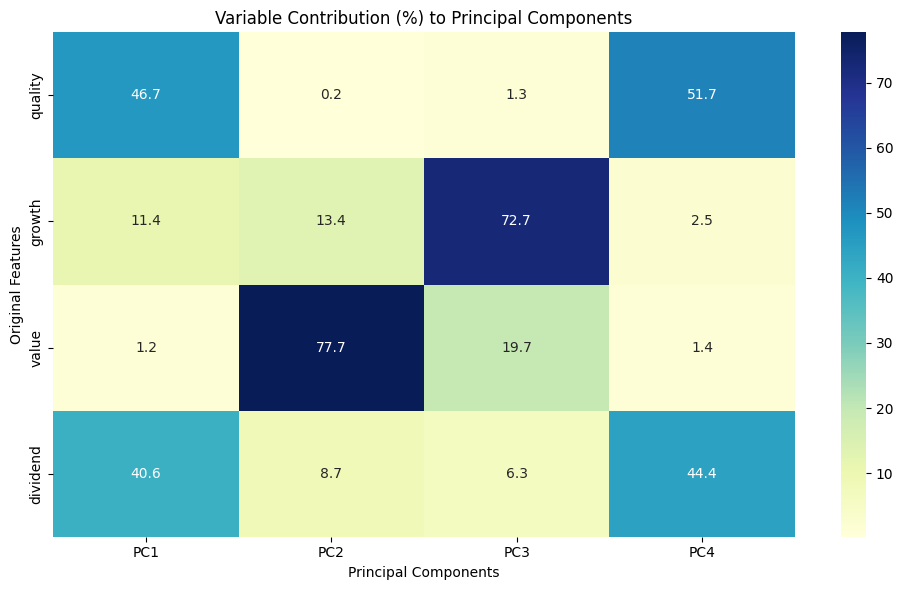

In [8]:
loadings = pd.DataFrame(
    pca.components_.T, columns=["PC1", "PC2", "PC3", "PC4"], index=features
)
# Square the loadings
squared_loadings = loadings**2

# Normalize by each component to get % contribution
contributions = squared_loadings.div(squared_loadings.sum(axis=0), axis=1) * 100

plt.figure(figsize=(10, 6))
sns.heatmap(contributions, annot=True, cmap="YlGnBu", fmt=".1f")
plt.title("Variable Contribution (%) to Principal Components")
plt.ylabel("Original Features")
plt.xlabel("Principal Components")
plt.tight_layout()
plt.show()

# Linear regression

In [9]:
from sklearn.linear_model import LinearRegression

for target_profit in [
    "profit_1m",
    "profit_3m",
    "profit_6m",
    "profit_1y",
    "profit_2y",
    "profit_5y",
]:
    X = df_pca[["PC1", "PC2", "PC3", "PC4"]]  # or include more PCs
    y = df_pca[target_profit]

    model = LinearRegression()
    model.fit(X, y)
    r2 = model.score(X, y)
    print(f"R^2 for predicting {target_profit} from PCs: {r2:.3f}")

R^2 for predicting profit_1m from PCs: 0.008
R^2 for predicting profit_3m from PCs: 0.017
R^2 for predicting profit_6m from PCs: 0.021
R^2 for predicting profit_1y from PCs: 0.043
R^2 for predicting profit_2y from PCs: 0.045
R^2 for predicting profit_5y from PCs: 0.018


# ARIMAX


ARIMAX Analysis for profit_1m
----------------------------------------
Performing stepwise search to minimize aic


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-92670.155, Time=3.70 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-104674.162, Time=7.93 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-109412.539, Time=6.58 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-92672.155, Time=2.09 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-109845.249, Time=14.17 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=56.22 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=31.00 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-109797.587, Time=9.70 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-108064.588, Time=9.47 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-109863.506, Time=22.21 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=35.59 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=-112272.288, Time=52.14 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=-109835.339, Time=27.56 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=-110798.223, Time=60.96 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,3)(0,0,0)[0]             : AIC=inf, Time=32.54 sec

Best model:  ARIMA(2,1,3)(0,0,0)[0] intercept
Total fit time: 371.864 seconds


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



Best ARIMA order: (2, 1, 3)
AIC: -117902.05
BIC: -117808.09


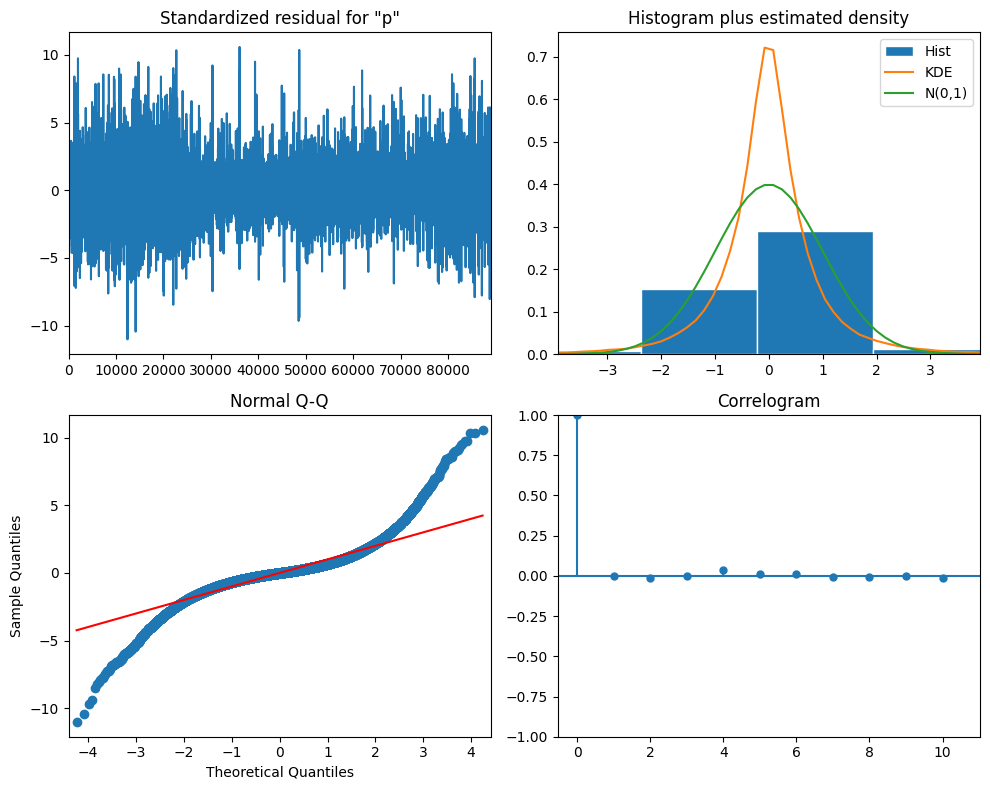


Exogenous Variables Summary:
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
PC1         7.291e-06      0.001      0.014      0.989      -0.001       0.001
PC2            0.0476      0.001     76.641      0.000       0.046       0.049
PC3           -0.0252      0.001    -37.383      0.000      -0.027      -0.024
PC4           -0.0052      0.001     -5.480      0.000      -0.007      -0.003
ar.L1          0.1624      0.097      1.683      0.092      -0.027       0.352
ar.L2          0.6175      0.083      7.405      0.000       0.454       0.781
ma.L1          0.0288      0.181      0.159      0.874      -0.327       0.384
ma.L2         -1.5379      0.251     -6.129      0.000      -2.030      -1.046
ma.L3          0.5085      0.070      7.294      0.000       0.372       0.645
sigma2         0.0080      0.002      3.803      0.000       0.004       0.012

ARIMAX Analysis for p

/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-41200.699, Time=4.45 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-42372.616, Time=2.45 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import numpy as np
from pmdarima import auto_arima

# We'll create ARIMAX models for each profit target using PCs as exogenous variables
profit_targets = [
    "profit_1m",
    "profit_3m",
    "profit_6m",
    "profit_1y",
    "profit_2y",
    "profit_5y",
]
exog_vars = df_pca[["PC1", "PC2", "PC3", "PC4"]]

for target in profit_targets:
    print(f"\nARIMAX Analysis for {target}")
    print("-" * 40)

    # Prepare the target variable
    y = df_pca[target]

    try:
        # Use auto_arima to find the best parameters
        auto_model = auto_arima(
            y,
            exogenous=exog_vars,
            start_p=0,
            start_q=0,
            max_p=3,
            max_q=3,
            m=1,
            start_P=0,
            seasonal=False,
            d=1,
            D=0,
            trace=True,
            error_action="ignore",
            suppress_warnings=True,
            stepwise=True,
        )

        best_order = auto_model.order

        # Fit ARIMAX model with best parameters
        model = SARIMAX(
            y,
            exog=exog_vars,
            order=best_order,
            enforce_stationarity=False,
            enforce_invertibility=False,
        )

        results = model.fit()

        # Print model summary
        print(f"\nBest ARIMA order: {best_order}")
        print(f"AIC: {results.aic:.2f}")
        print(f"BIC: {results.bic:.2f}")

        # Plot diagnostics
        fig = results.plot_diagnostics(figsize=(10, 8))
        plt.tight_layout()
        plt.show()

        # Print summary of exogenous variables impact
        print("\nExogenous Variables Summary:")
        print(results.summary().tables[1])

    except Exception as e:
        print(f"Error fitting model for {target}: {str(e)}")

### Including dummy variables

In [ ]:
# Convert categorical variables to string type
df_pca["country"] = df["country"].astype(str)
df_pca["sector"] = df["sector"].astype(str)

# Create dummy variables for categorical columns
dummy_country = pd.get_dummies(df_pca["country"], prefix="country")
dummy_sector = pd.get_dummies(df_pca["sector"], prefix="sector")

# Combine PCA components with dummy variables
exog_vars_with_dummies = pd.concat([exog_vars, dummy_country, dummy_sector], axis=1)

# Drop one category from each dummy variable group to avoid multicollinearity
exog_vars_with_dummies = exog_vars_with_dummies.drop(
    columns=[dummy_country.columns[0], dummy_sector.columns[0]]
)

# Convert all columns to numeric type
exog_vars_with_dummies = exog_vars_with_dummies.astype(float)

for target in profit_targets:
    print(f"\nARIMAX Analysis for {target} with Dummy Variables")
    print("-" * 50)

    # Prepare the target variable and ensure numeric type
    y = df_pca[target].astype(float)

    try:
        # Fit ARIMAX model with dummy variables
        model = SARIMAX(
            y,
            exog=exog_vars_with_dummies,
            order=(1, 1, 1),
            enforce_stationarity=False,
            enforce_invertibility=False,
        )

        results = model.fit()

        # Print model summary
        print(f"AIC: {results.aic:.2f}")
        print(f"BIC: {results.bic:.2f}")

        # Plot diagnostics
        fig = results.plot_diagnostics(figsize=(10, 8))
        plt.tight_layout()
        plt.show()

        # Print summary of exogenous variables impact
        print("\nExogenous Variables Summary:")
        print(results.summary().tables[1])

    except Exception as e:
        print(f"Error fitting model for {target}: {str(e)}")

# Prophet

In [ ]:
# Import Prophet
from prophet import Prophet
import pandas as pd

# Checking df format
# assert df.shape[0] == df_pca.shape[0]
print("shapes:", df.shape, df_pca.shape)

df_pca["date"] = df["date"]
print(df_pca.head())

# Drop nan values
df_pca = df_pca.dropna()

# Define original score columns
original_scores = ["quality", "value", "growth", "dividend"]

print("Prophet Analysis")
print("-" * 50)

for target in profit_targets:
    print(f"\nProphet Analysis for {target}")
    print("-" * 30)

    results = []

    # Run two models - one with PCA variables, one with original scores
    for model_type, features in [
        ("PCA Variables", exog_vars_with_dummies),
        ("Original Scores", df[original_scores]),
    ]:
        try:
            print(f"\nModel with {model_type}:")

            # Prepare data in Prophet format
            prophet_df = pd.DataFrame({"ds": df_pca["date"], "y": df_pca[target]})

            # Add features as additional regressors
            for col in features.columns:
                prophet_df[col] = features[col]

            # Initialize and fit Prophet model
            model = Prophet(
                yearly_seasonality=True,
                weekly_seasonality=True,
                daily_seasonality=False,
                interval_width=0.95,
            )

            # Add features as regressors
            for col in features.columns:
                model.add_regressor(col)

            model.fit(prophet_df)

            # Make predictions on the training set
            forecast = model.predict(prophet_df)

            # Plot the results
            fig = model.plot(forecast)
            plt.title(f"Prophet Forecast for {target} using {model_type}")
            plt.show()

            # Plot components
            fig = model.plot_components(forecast)
            plt.show()

            # Calculate metrics
            mse = np.mean((forecast["yhat"] - prophet_df["y"]) ** 2)
            rmse = np.sqrt(mse)
            mae = np.mean(np.abs(forecast["yhat"] - prophet_df["y"]))

            results.append({"model": model_type, "rmse": rmse, "mae": mae})

            print(f"Model Metrics:")
            print(f"RMSE: {rmse:.4f}")
            print(f"MAE: {mae:.4f}")

        except Exception as e:
            print(
                f"Error fitting Prophet model for {target} with {model_type}: {str(e)}"
            )

    # Compare results
    print(f"\nComparison for {target}:")
    print("-" * 30)
    for result in results:
        print(f"{result['model']}:")
        print(f"RMSE: {result['rmse']:.4f}")
        print(f"MAE: {result['mae']:.4f}")
        print()